# The final project for Game of Life on the Penrose Tiling 
## made by Zheng Fang on 2022.07.22
## Department of Mathematics, Denison University

In [1]:
using Pkg
Pkg.add("Luxor")
Pkg.add("Colors")
Pkg.add("DataStructures")
Pkg.add("JLD2")
Pkg.add("FileIO")
Pkg.add("Plots")
using Luxor
using Colors
using DataStructures
using JLD2
using FileIO
using Plots

    Updating registry at `C:\Users\17404\.julia\registries\General.toml`
   Resolving package versions...
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\17404\.julia\environments\v1.7\Manifest.toml`
   Resolving package versions...
  No Changes t

In [2]:
phi = (1 + sqrt(5)) / 2                                     # Define the Golden ratio by phi
sidelength = 50                                             # Set up a sidelength for each tile's short edge
tolerance = 0.001                                           #set tolerance for finding neighbors

0.001

In [3]:
function dart(radialdistance, polarangle, orientation) #function for drawing a dart
    ```
    radialdistance is the distance between rotation center and the origin
    polarangle is the turing angle before the turle move forward by r
    orientation is the rotation degrees of starting drawing the dart or kite
    ```
    
    #move the turtle to the position of starting place by polar coordinate and rotation
    Penup(t)
    Turn(t, polarangle)
    Forward(t, radialdistance)
    Turn(t, -polarangle)
    Turn(t, orientation)
    Pendown(t)
    
    #start to draw a dart 
    Pencolor(t, "Black")
    Forward(t, sidelength)
    Turn(t, -36)
    Forward(t, sidelength)
    Turn(t, 144)
    Forward(t, sidelength * phi)
    Turn(t, 108)
    Forward(t, sidelength * phi)
    Turn(t, 144)
    
    #move the turtle back to the origin
    Penup(t)
    Turn(t, -orientation)
    Turn(t, polarangle)
    Forward(t, -radialdistance)
    Turn(t, -polarangle)
    Pendown(t)
end

dart (generic function with 1 method)

In [4]:
function kite(radialdistance, polarangle, orientation) #function for drawing a kite
    ```
    radialdistance is the distance between rotation center and the origin
    polarangle is the turing angle before the turle move forward by r
    orientation is the rotation degrees of starting drawing the dart or kite
    ```
    
    #move the turtle to the position of starting place by polar coordinate and rotation
    Penup(t)
    Turn(t, polarangle)
    Forward(t, radialdistance)
    Turn(t, -polarangle)
    Turn(t, orientation)
    Pendown(t)
    
    #start to draw a kite
    Pencolor(t, "Black")
    Turn(t, 108)
    Forward(t, sidelength)
    Turn(t, 108)
    Forward(t, sidelength * phi)
    Turn(t, 108)
    Forward(t, sidelength * phi)
    Turn(t, 108)
    Forward(t, sidelength)
    Turn(t, -72)
    
    #move the turtle back to the origin
    Penup(t)
    Turn(t, -orientation)
    Turn(t, polarangle)
    Forward(t, -radialdistance)
    Turn(t, -polarangle)
    Pendown(t)
end

kite (generic function with 1 method)

In [5]:
function draw(graph) # function for drawing dart or kite by stored information
    for i in 1:length(graph)
        if graph[i][1] == "K"
            kite(graph[i][2],graph[i][3],graph[i][4])
        else
            dart(graph[i][2],graph[i][3],graph[i][4])
        end
    end
end

draw (generic function with 1 method)

In [6]:
function substitution(graph)
    
    number_tiles = length(graph)#Remember the number of tiles at the beginning
    
    for i in 1:length(graph)#Do substitution for each tile
        
        #find the new distance by doing a vector addition
        if graph[i][1] == "K"
            y = graph[i][2] * sin(-(graph[i][3] * pi / 180)) + sidelength * sin((180 - graph[i][4]) * pi / 180)
            x = graph[i][2] * cos(-(graph[i][3] * pi / 180)) + sidelength * cos((180 - graph[i][4]) * pi / 180)
            new_radialdistance = sqrt(y^2+x^2)
            
            #Find the new angle based on the x-y relation
                if x > 0
                    new_polarangle = atan(y/x) * 180 /pi
                elseif x < 0 && y >= 0
                    new_polarangle = atan(y/x) * 180 /pi + 180
                elseif x < 0 && y < 0
                    new_polarangle = atan(y/x) * 180 /pi - 180
                elseif x == 0 && y > 0
                    new_polarangle = 90
                elseif x == 0 && y < 0
                    new_polarangle = -90
                elseif x == 0 && y == 0
                    new_polarangle = 0
                end
            
            #darw new tiles
            push!(graph, ["K",new_radialdistance,-new_polarangle,graph[i][4] + 108])
            push!(graph, ["K",new_radialdistance,-new_polarangle,graph[i][4] - 108])
            push!(graph, ["D",new_radialdistance,-new_polarangle,graph[i][4] + 144])
        else
            y = graph[i][2] * sin(-(graph[i][3] * pi / 180)) + sidelength * phi * sin(-(graph[i][4] * pi / 180))
            x = graph[i][2] * cos(-(graph[i][3] * pi / 180)) + sidelength * phi * cos(-(graph[i][4] * pi / 180))
            new_radialdistance = sqrt(y^2+x^2)
                if x > 0
                    new_polarangle = atan(y/x) * 180 /pi
                elseif x < 0 && y >= 0
                    new_polarangle = atan(y/x) * 180 /pi + 180
                elseif x < 0 && y < 0
                    new_polarangle = atan(y/x) * 180 /pi - 180
                elseif x == 0 && y > 0
                    new_polarangle = 90
                elseif x == 0 && y < 0
                    new_polarangle = -90
                elseif x == 0 && y == 0
                    new_polarangle = 0
                end
            
            push!(graph, ["K",new_radialdistance,-new_polarangle,graph[i][4] - 108])
            push!(graph, ["D",new_radialdistance,-new_polarangle,graph[i][4] + 144])
        end
    end
    
    for i in 1:number_tiles
        popfirst!(graph)
    end
    
end

substitution (generic function with 1 method)

In [7]:
function vertices(graph) # find vertices of every tile
    
    for i in 1:length(graph)
        
        if graph[i][1] == "K"
            
            r = sqrt((phi * sidelength)^2 + sidelength^2 - 2 * phi * sidelength^2 * cos(72 * pi / 180))
            
            vertex1 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180))]
            vertex2 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)) + sidelength * cos((180 - graph[i][4] + 72) * pi / 180),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180)) + sidelength * sin((180 - graph[i][4] + 72) * pi / 180)]
            vertex3 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)) + r * cos((180 - graph[i][4]) * pi / 180),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180)) + r * sin((180 - graph[i][4]) * pi / 180)]
            vertex4 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)) + sidelength * cos((180 - graph[i][4] - 72) * pi / 180),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180)) + sidelength * sin((180 - graph[i][4] - 72) * pi / 180)]
            
        else
            r = sqrt(2 * (sidelength)^2 - 2 * sidelength^2 * cos(144 * pi / 180))
            
            vertex1 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180))]
            vertex2 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)) + sidelength * cos((graph[i][4]) * pi / 180),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180)) + sidelength * sin(- (graph[i][4]) * pi / 180)]
            vertex3 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)) + r * cos((graph[i][4] - 18) * pi / 180),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180)) + r * sin(- (graph[i][4] - 18) * pi / 180)]
            vertex4 = [graph[i][2] * cos(-(graph[i][3] * pi / 180)) + sidelength * phi * cos((graph[i][4] + 36) * pi / 180),
                       graph[i][2] * sin(-(graph[i][3] * pi / 180)) + sidelength * phi * sin(-(graph[i][4] + 36) * pi / 180)]
        end

        push!(vertices_list,[vertex1,vertex2,vertex3,vertex4])
    end
end

vertices (generic function with 1 method)

In [8]:
function neighbor(graph,vertices_list) # find neighbors of every tile

    for i in 1:length(graph)
        neighbors = []
        
        #compare every vertex
        for j in 1:length(graph)

            for m in 1:4 , n in 1:4
                if sqrt((vertices_list[i][m][1] - vertices_list[j][n][1])^2 + (vertices_list[i][m][2] - vertices_list[j][n][2])^2) < tolerance
                    push!(neighbors, j)
                end
            end
        end
        
        #divid neigbors by sharing edge or vertex
        c = counter(neighbors)
        
        edge = []
        vertex = []
        
        for tile_number in keys(c)
            if c[tile_number] == 1
                push!(vertex, tile_number)
                
            elseif c[tile_number] == 2
                push!(edge, tile_number)
                
            end
        end
        
        neighbor_dic[i] = [edge,vertex]
    end
end

neighbor (generic function with 1 method)

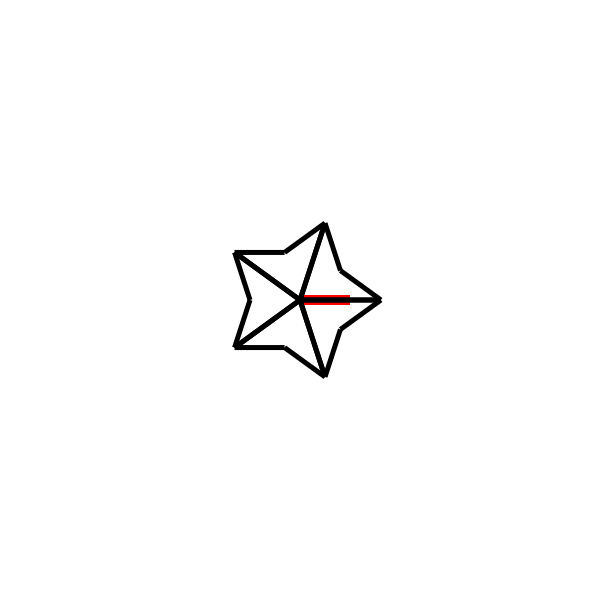

In [9]:
center_distance = phi * sidelength

#initial tiles
graph = [["D",center_distance,72,-144],
        ["D",center_distance,144,-72],
        ["D",center_distance,216,0],
        ["D",center_distance,288,72],
        ["D",center_distance,0,144]]

@draw begin
    t = Turtle()
    
    Pencolor(t, "Red")
    Penwidth(t, 10)
    Forward(t, 50)
    Forward(t, -50
    )
    
    Penwidth(t,5)
    draw(graph)
end

In [10]:
#repeat 8 times to get 7985 tiles
for n in 1:8    
    for i in 1:length(graph)
        graph[i][2] = graph[i][2] * phi
    end
    substitution(graph)
end

@svg begin
    t = Turtle()
    
    Pencolor(t, "Red")
    Penwidth(t, 10)
    Forward(t, 50)
    Forward(t, -50)
    
    Penwidth(t,5)
    draw(graph)
end 5000 5000 "tiling.svg"

In [11]:
graph

7985-element Vector{Vector{Any}}:
 ["K", 1775.9301574491483, 98.98162875641731, 504]
 ["K", 1775.9301574491483, 98.98162875641731, 288]
 ["D", 1775.9301574491483, 98.98162875641731, 540]
 ["K", 1793.2997124931403, 95.97920001974968, 288]
 ["K", 1793.2997124931403, 95.97920001974968, 72]
 ["D", 1793.2997124931403, 95.97920001974968, 324]
 ["K", 1872.5032115768097, 96.49476516923183, 324]
 ["D", 1872.5032115768097, 96.49476516923183, 576]
 ["K", 1640.3310249677518, 96.53911734601036, 288]
 ["K", 1640.3310249677518, 96.53911734601036, 72]
 ["D", 1640.3310249677518, 96.53911734601036, 324]
 ["K", 1682.0561809192413, 99.48739102738347, 72]
 ["K", 1682.0561809192413, 99.48739102738347, -144]
 ⋮
 ["K", 2393.9950075494326, 13.895488430606994, 756]
 ["D", 2393.9950075494326, 13.895488430606994, 1008]
 ["K", 2359.852671669831, 16.035371256113883, 756]
 ["K", 2359.852671669831, 16.035371256113883, 540]
 ["D", 2359.852671669831, 16.035371256113883, 792]
 ["K", 2283.979920830989, 15.342403647090892

In [12]:
vertices_list = []
vertices(graph)
vertices_list

7985-element Vector{Any}:
 [[-277.25424859373476, -1754.1544988324374], [-292.70509831248216, -1706.6016730176798], [-211.8033988749874, -1706.6016730176798], [-236.8033988749874, -1783.5437614470611]]
 [[-277.25424859373476, -1754.1544988324374], [-236.80339887498738, -1783.5437614470611], [-302.25424859373476, -1831.0965872618187], [-327.25424859373476, -1754.1544988324374]]
 [[-277.25424859373476, -1754.1544988324374], [-327.25424859373476, -1754.1544988324374], [-367.7050983124821, -1783.5437614470611], [-342.70509831248216, -1706.6016730176798]]
 [[-186.8033988749879, -1783.5437614470613], [-146.3525491562405, -1812.933024061685], [-211.8033988749879, -1860.4858498764427], [-236.8033988749879, -1783.5437614470613]]
 [[-186.8033988749879, -1783.5437614470613], [-236.8033988749879, -1783.5437614470613], [-211.8033988749879, -1706.60167301768], [-146.3525491562405, -1754.1544988324376]]
 [[-186.8033988749879, -1783.5437614470613], [-146.3525491562405, -1754.1544988324376], [-130.9016

In [13]:
neighbor_dic = Dict()
neighbor(graph,vertices_list)
neighbor_dic

Dict{Any, Any} with 7985 entries:
  4986 => Vector{Any}[[4959, 4958, 4987, 4990], [4964, 4988, 4989, 4980, 5161]]
  7329 => Vector{Any}[[7330, 7341, 7340, 7333], [7332, 7314, 7331, 7336, 6602]]
  4700 => Vector{Any}[[4671, 4699, 4632, 4630], [4631, 4698, 4682]]
  4576 => Vector{Any}[[4575, 4763, 4774, 4577], [4569, 4777, 4579, 4653, 4778]]
  7144 => Vector{Any}[[7143, 7175, 7145, 7150], [7178, 7147, 7146, 7156, 7179]]
  6073 => Vector{Any}[[6102, 6150, 6074, 6149], [6144, 5971, 6070]]
  2288 => Vector{Any}[[2284, 2289, 2303, 2287], [4391, 2285, 2292, 2296, 2291]]
  1703 => Vector{Any}[[1676, 1704, 1675, 1707], [3009, 1705, 1681, 1697, 1706]]
  1956 => Vector{Any}[[1952, 1950, 1680, 1955], [1953, 3144, 1949, 1700, 1681, …
  2350 => Vector{Any}[[2351, 2324, 2339, 2325], [2343, 2133, 2319, 2347]]
  7685 => Vector{Any}[[7697, 7689, 7698, 7686], [7687, 7688, 7693, 7704, 7692]]
  5975 => Vector{Any}[[5974, 5936, 5946, 5934], [5925, 5935, 5957, 5973]]
  3406 => Vector{Any}[[3405, 3407, 3402, 

In [14]:
function find_white_tile(counters)
    #creat a list from 1 to 7985
    for i in 1:7985
        push!(white_tiles, i)
    end
    
    #remove all the number in the list of counters from 7985
    for j in counters
        filter!(x->x≠j,white_tiles)
    end
    
end

find_white_tile (generic function with 1 method)

In [15]:
function find_black_tile(white_tiles)
    #creat a list from 1 to 7985
    for i in 1:7984
        push!(black_tiles, i)
    end
    
    #remove all the number in the list of white tiles from 7985
    for j in white_tiles
        filter!(x->x≠j,black_tiles)
    end
    
end

find_black_tile (generic function with 1 method)

In [16]:
function find_neighbor_of_black(black_tiles)
    
    #for every black tile we, find thier number of neighbors
    for i in black_tiles
        count = 0
        
        #find neighbors by edges
        for j in neighbor_dic[i][1]
            for x in black_tiles
                if x == j
                    count+=1
                end
            end
        end
        
        #find neighbors by vertices
        for l in neighbor_dic[i][2]
            for y in black_tiles
                if y == l
                    count+=1
                end
            end
        end
        
        push!(neighbor_of_black,[i,count])
    end
    
end

find_neighbor_of_black (generic function with 1 method)

In [17]:
function find_neighbor_of_white(white_tiles)
    
    for i in white_tiles
        count = 0
        
        for j in neighbor_dic[i][1]
            for x in black_tiles
                if x == j
                    count+=1
                end
            end
        end
        
        for l in neighbor_dic[i][2]
            for y in black_tiles
                if y == l
                    count+=1
                end
            end
        end
        
        push!(neighbor_of_white,[i,count])
    end
    
end

find_neighbor_of_white (generic function with 1 method)

In [18]:
function run_rules_of_GoL(neighbor_of_white,neighbor_of_black)
    
    #the Survival rule of Game of Life
    for i in 1:length(neighbor_of_black)
        if neighbor_of_black[i][2] == 2 || neighbor_of_black[i][2] == 3
            push!(counters,neighbor_of_black[i][1])
        end
    end
    
    #the Death rule of Game of Life is not use because we assmue every tile is white at first and change alive tile into black
    
    #the Birth rule of Game of Life
    for i in 1:length(neighbor_of_white)
        if neighbor_of_white[i][2] == 3
            push!(counters,neighbor_of_white[i][1])
        end
    end
        
end

run_rules_of_GoL (generic function with 1 method)

In [19]:
# random list of alive tiles
random_counters = rand(1:7985, 1000)

#how many steps of generation of playing game of life
steps = 20

20

In [20]:
#test the function to find all white tiles
white_tiles = []
find_white_tile(random_counters)
white_tiles

#test the function to find all black tiles
#sum of numbers of black and white tiles is 7985
black_tiles = []
find_black_tile(white_tiles)
black_tiles

#test function to find correct number of neighbor of black tiles
neighbor_of_black = []
find_neighbor_of_black(black_tiles)
neighbor_of_black

#test function to find correct number of neighbor of white tiles
neighbor_of_white = []
find_neighbor_of_white(white_tiles)
neighbor_of_white

counters = []
run_rules_of_GoL(neighbor_of_white,neighbor_of_black)
counters

Drawing(8000, 8000, "original_picture_4.png")

origin()

# draw the empty tiling paper
for i in 1:length(vertices_list)

    poly([Point(vertices_list[i][1][1],vertices_list[i][1][2]),
        Point(vertices_list[i][2][1],vertices_list[i][2][2]),
        Point(vertices_list[i][3][1],vertices_list[i][3][2]),
        Point(vertices_list[i][4][1],vertices_list[i][4][2])], close=true, :stroke)

end

setopacity(0.5)

#based onthe random number generated, draw all these numbered tiles (some are overlap)
for j in counters
    poly([Point(vertices_list[j][1][1],vertices_list[j][1][2]),
            Point(vertices_list[j][2][1],vertices_list[j][2][2]),
            Point(vertices_list[j][3][1],vertices_list[j][3][2]),
            Point(vertices_list[j][4][1],vertices_list[j][4][2])], :fill)
end

finish()
preview()

In [21]:
for n in 1:steps
    #find all white tiles
    white_tiles = []
    find_white_tile(counters)

    #find all black tiles
    black_tiles = []
    find_black_tile(white_tiles)

    #find neighbors of all black tiles
    neighbor_of_black = []
    find_neighbor_of_black(black_tiles)

    #find neighbors of all white tiles
    neighbor_of_white = []
    find_neighbor_of_white(white_tiles)

    #find all counters after one step of game of life
    counters = []
    run_rules_of_GoL(neighbor_of_white,neighbor_of_black)

    #draw the picture
    Drawing(8000, 8000,"generation_4-$n.png")

    origin()

    # draw the empty tiling paper
    for i in 1:length(vertices_list)

        poly([Point(vertices_list[i][1][1],vertices_list[i][1][2]),
            Point(vertices_list[i][2][1],vertices_list[i][2][2]),
            Point(vertices_list[i][3][1],vertices_list[i][3][2]),
            Point(vertices_list[i][4][1],vertices_list[i][4][2])],close=true, :stroke)

    end

    setopacity(0.5)

    #based onthe random number generated, draw all these numbered tiles (some are overlap)
    for j in counters
        poly([Point(vertices_list[j][1][1],vertices_list[j][1][2]),
                Point(vertices_list[j][2][1],vertices_list[j][2][2]),
                Point(vertices_list[j][3][1],vertices_list[j][3][2]),
                Point(vertices_list[j][4][1],vertices_list[j][4][2])], :fill)
    end

    finish()
end